ℹ️ TeX not available. Using standard serif fonts.
Generatings plots from: chiEFT_radio_GW170817/outdir/results.h5
Displaying plots inline (Saving Disabled)
📂 Opening: chiEFT_radio_GW170817/outdir/results.h5
✅ Loaded 2000 posterior samples.
Creating mass-radius plot...



📋 AVAILABLE PARAMETERS (Use these names in CONFIG)
• E_sym                    • K_sat                    • K_sym                    
• L_sym                    • M_TOV                    • P_3nsat                  
• Q_sat                    • Q_sym                    • R_1.4                    
• Z_sat                    • Z_sym                    • cs2_CSE_0                
• cs2_CSE_1                • cs2_CSE_2                • cs2_CSE_3                
• cs2_CSE_4                • cs2_CSE_5                • cs2_CSE_6                
• cs2_CSE_7                • cs2_CSE_8                • kappa_eibi               
• n_CSE_0_u                • n_CSE_1_u                • n_CSE_2_u                
• n_CSE_3_u                • n_CSE_4_u                • n_CSE_5_u                
• n_CSE_6_u                • n_CSE_7_u                • nbreak                   



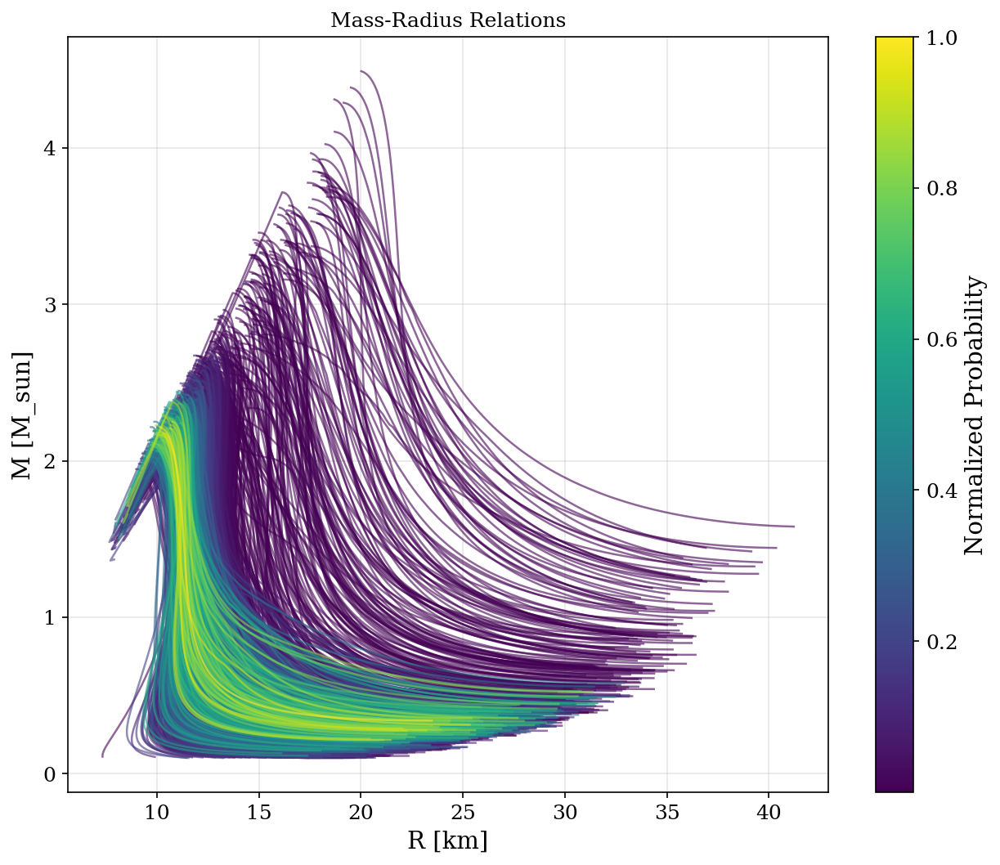

Creating pressure-density plot...


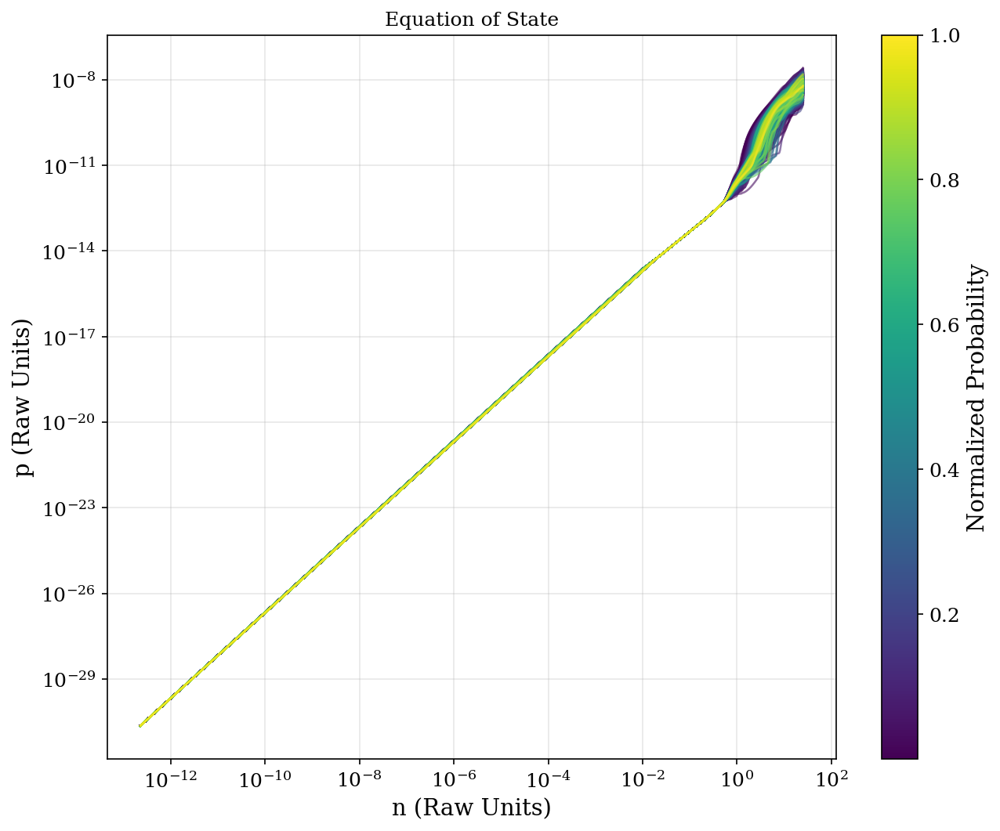

Creating cs2-density plot...


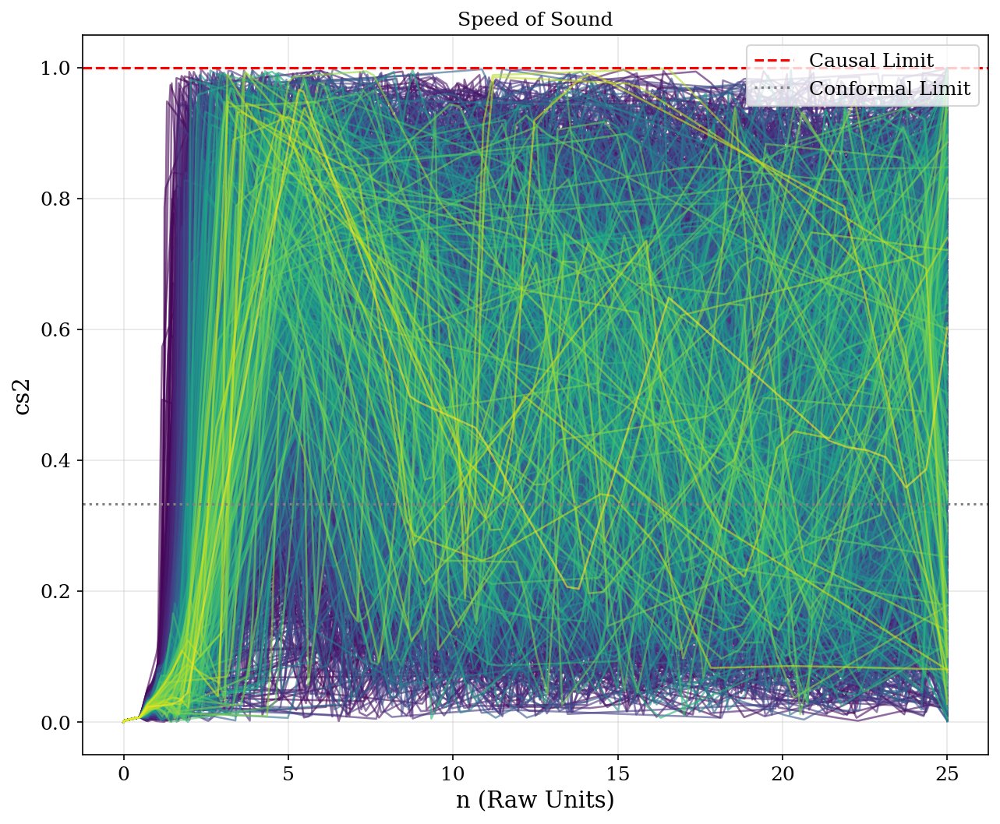

Creating parameter histograms...


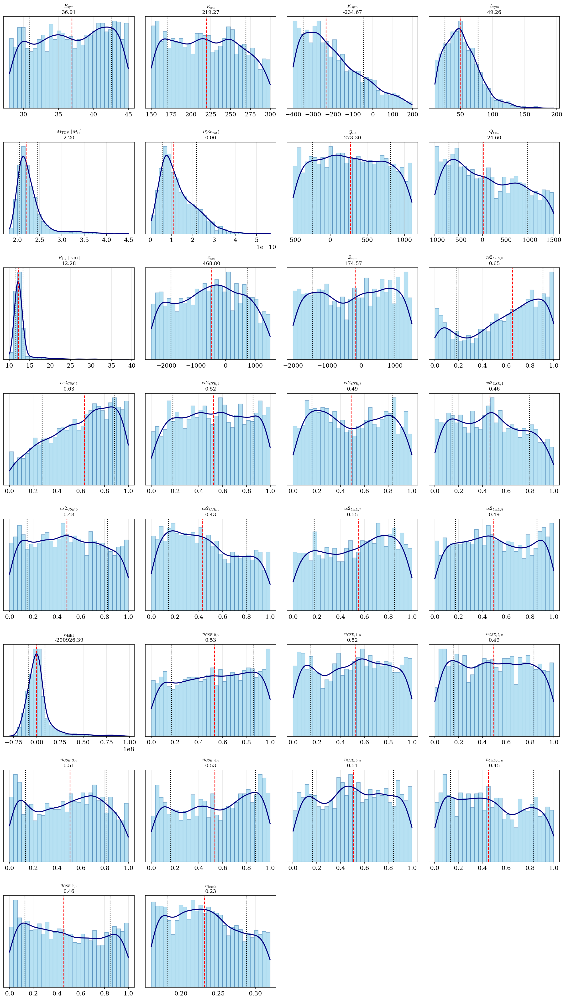

Creating cornerplot...
👉 Auto selection: ['M_TOV', 'R_1.4', 'L_sym', 'K_sat', 'E_sym', 'kappa_eibi', 'nbreak']


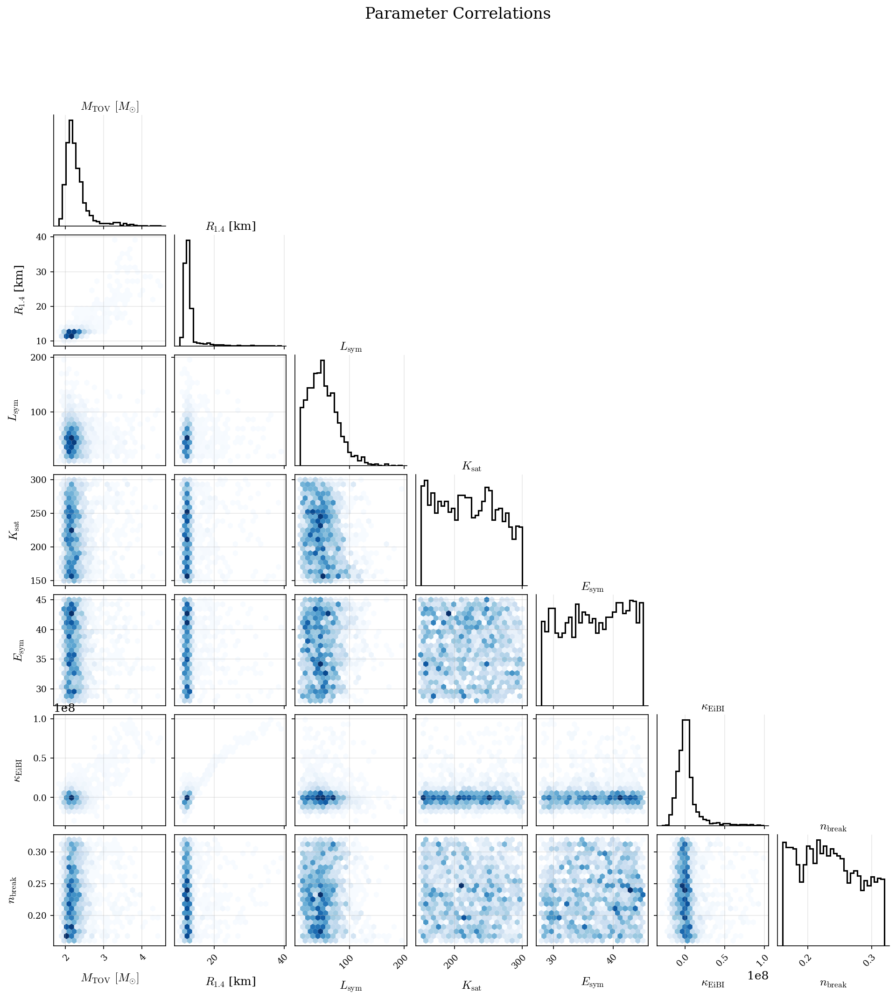

✅ All plots generated successfully.


In [9]:
r"""Modular postprocessing script for EOS inference results (Interactive Version).

FEATURES:
1. Dynamic Parameter Discovery: Reads whatever is in the H5 file.
2. Manual Selection: You choose exactly which parameters to plot.
3. Smart Layering: Highest probability curves are plotted ON TOP (Front).
4. Auto-Scaling: No hardcoded limits.
"""

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
import h5py
import os
import logging
from scipy.stats import gaussian_kde
from typing import Dict, Optional, Any, List
import warnings

# ==============================================================================
#                               USER CONFIGURATION
# ==============================================================================

# 1. FILE PATHS


# 2. PLOT AESTHETICS & QUALITY
PLOT_CONFIG = {
    "DPI": 150,                 # Image resolution (increase for publication)
    "FIG_SIZE": (10, 8),        # Default figure size
    "USE_TEX": True,            # Try LaTeX rendering (auto-fallback if missing)
    "CMAP": plt.cm.viridis,     # Colormap (Viridis, Magma, Plasma, Inferno)
    "HIST_BINS": 30,            # Bins for 1D histograms
    "HIST_STYLE": "density",    # 'density' or 'count'
    "SHOW_TITLES": True,        # Show median +/- error titles
}

# 3. MANUAL PARAMETER SELECTION
# Set to None to use Auto-Selection (plots everything or defaults).
# Set to a list of strings to select specific parameters.
# Check the "AVAILABLE PARAMETERS" output log to see exact names.

# Example: CORNER_PARAMS = ['M_TOV', 'R_1.4', 'kappa_eibi', 'L_sym']
CORNER_PARAMS = None 

# Example: HIST_PARAMS = ['M_TOV', 'R_1.4', 'nbreak']
HIST_PARAMS = None   

# ==============================================================================
#                                  SYSTEM SETUP
# ==============================================================================

logging.basicConfig(level=logging.INFO, format='%(message)s')
logger = logging.getLogger("jester")

def setup_matplotlib(use_tex: bool = True) -> bool:
    """Configure matplotlib plotting parameters with robust font fallback."""
    plt.rcParams.update({
        "axes.grid": True,
        "grid.alpha": 0.3,
        "axes.labelsize": 14,
        "xtick.labelsize": 12,
        "ytick.labelsize": 12,
        "legend.fontsize": 12,
        "figure.titlesize": 16,
        "mathtext.fontset": "cm",
        "font.family": "serif",
    })

    tex_enabled = False
    if use_tex:
        try:
            from matplotlib.checkdep_usetex import checkdep_usetex
            if checkdep_usetex(True):
                plt.rcParams.update({
                    "text.usetex": True,
                    "font.serif": ["Computer Modern Roman", "Times New Roman"],
                })
                tex_enabled = True
                logger.info("✅ TeX rendering enabled")
            else:
                raise RuntimeError("LaTeX executable not found")
        except Exception:
            logger.info(f"ℹ️ TeX not available. Using standard serif fonts.")
            plt.rcParams.update({
                "text.usetex": False,
                "font.serif": ["DejaVu Serif", "Liberation Serif", "serif"],
            })
    return tex_enabled

TEX_ENABLED = setup_matplotlib(use_tex=PLOT_CONFIG["USE_TEX"])
DEFAULT_COLORMAP = PLOT_CONFIG["CMAP"]
COLORS_DICT = {"prior": "gray", "posterior": "blue"}

# ====================== DATA LOADING ======================

def load_eos_data(filepath: str) -> Dict[str, Any]:
    """Load data dynamically based on JESTER HDF5 structure."""
    if not os.path.exists(filepath):
        raise FileNotFoundError(f"File not found: {filepath}")
    
    logger.info(f"📂 Opening: {filepath}")
    with h5py.File(filepath, 'r') as f:
        data = {}
        if 'posterior' not in f:
            raise ValueError("Invalid H5: 'posterior' group not found.")
        post_group = f['posterior']
        
        # 1. Load EOS Curves
        if 'derived_eos' in post_group:
            eos_group = post_group['derived_eos']
            data['masses'] = eos_group.get('masses_EOS', eos_group.get('masses'))[:]
            data['radii'] = eos_group.get('radii_EOS', eos_group.get('radii'))[:]
            data['densities'] = eos_group.get('n')[:]/0.16e45
            data['pressures'] = eos_group.get('p')[:]
            data['cs2'] = eos_group.get('cs2')[:]
            data['lambdas'] = eos_group.get('Lambdas_EOS', eos_group.get('lambdas'))[:]
        else:
            data['masses'] = post_group.get('masses')[:]
            data['radii'] = post_group.get('radii')[:]
            data['densities'] = post_group.get('n')[:]/0.16e45
            data['pressures'] = post_group.get('p')[:]
            data['cs2'] = post_group.get('cs2')[:]
            data['lambdas'] = post_group.get('Lambdas', post_group.get('lambdas'))[:]
        
        # 2. Log Prob
        data['log_prob'] = post_group.get('log_prob')[:]
        
        # 3. Load Parameters (Base)
        if 'parameters' in post_group:
            param_group = post_group['parameters']
            keys = list(param_group.keys())
            data['parameters'] = {key: param_group[key][:] for key in keys}
        else:
            data['parameters'] = {}

    # 4. Calculate Derived Quantities
    data = calculate_derived_quantities(data)
    
    # Print Available Parameters for User
    print_available_parameters(data['parameters'])

    logger.info(f"✅ Loaded {len(data['masses'])} posterior samples.")
    return data

def calculate_derived_quantities(data: Dict[str, Any]) -> Dict[str, Any]:
    """Calculates M_TOV, R1.4, P(3n_sat) and adds them to parameters."""
    m_arr, r_arr = data['masses'], data['radii']
    n_arr, p_arr = data['densities'], data['pressures']
    
    mtovs, r14s, p3nsats = [], [], []
    
    for i in range(len(m_arr)):
        mtovs.append(np.max(m_arr[i]))
        try:
            sort_idx = np.argsort(m_arr[i])
            r14 = np.interp(1.4, m_arr[i][sort_idx], r_arr[i][sort_idx])
            r14s.append(r14)
        except: r14s.append(np.nan)
        try:
            sort_idx = np.argsort(n_arr[i])
            p3 = np.interp(3.0, n_arr[i][sort_idx], p_arr[i][sort_idx])
            p3nsats.append(p3)
        except: p3nsats.append(np.nan)
            
    data['parameters']['M_TOV'] = np.array(mtovs)
    data['parameters']['R_1.4'] = np.array(r14s)
    data['parameters']['P_3nsat'] = np.array(p3nsats)
    return data

def print_available_parameters(params: Dict[str, np.ndarray]):
    """Helper to show user what they can plot."""
    keys = sorted(list(params.keys()))
    print("\n" + "="*50)
    print("📋 AVAILABLE PARAMETERS (Use these names in CONFIG)")
    print("="*50)
    
    # Print in columns
    col_width = 25
    for i in range(0, len(keys), 3):
        chunk = keys[i:i+3]
        row_str = "".join([f"• {key:<{col_width}}" for key in chunk])
        print(row_str)
    print("="*50 + "\n")

def load_prior_data(prior_path: Optional[str]) -> Optional[Dict[str, Any]]:
    if not prior_path: return None
    try: return load_eos_data(prior_path)
    except Exception as e:
        logger.warning(f"Could not load prior: {e}")
        return None

# ====================== UTILS: LABELS & SORTING ======================

def get_fancy_label(name: str) -> str:
    """Converts code names to pretty LaTeX labels."""
    MAPPING = {
        'M_TOV': r'$M_{\rm{TOV}}$ $[M_{\odot}]$', 'MTOV': r'$M_{\rm{TOV}}$ $[M_{\odot}]$',
        'R_1.4': r'$R_{1.4}$ [km]', 'R14': r'$R_{1.4}$ [km]',
        'P_3nsat': r'$P(3n_{\rm{sat}})$',
        'L_sym': r'$L_{\rm{sym}}$', 'K_sat': r'$K_{\rm{sat}}$',
        'E_sym': r'$E_{\rm{sym}}$', 'Q_sat': r'$Q_{\rm{sat}}$',
        'Z_sat': r'$Z_{\rm{sat}}$', 'nbreak': r'$n_{\rm{break}}$',
        'kappa_eibi': r'$\kappa_{\rm{EiBI}}$',
    }
    if name in MAPPING: return MAPPING[name]
    if '_' in name:
        parts = name.split('_')
        base = parts[0]
        # Greek letter check
        if base in ['alpha', 'beta', 'gamma', 'delta', 'epsilon', 'rho', 'sigma', 'lambda', 'kappa']:
            base = f"\\{base}"
        sub = ','.join(parts[1:])
        return f"${base}_{{{sub}}}$"
    return f"${name}$"

def get_sorted_indices_by_prob(log_prob):
    """Returns indices sorted so highest probability is LAST (on top)."""
    return np.argsort(log_prob)

# ====================== PLOTTING FUNCTIONS ======================

def make_cornerplot(data: Dict[str, Any], outdir: str, selection: Optional[List[str]] = None):
    logger.info("Creating cornerplot...")
    full_params = data['parameters']
    all_keys = sorted(list(full_params.keys()))
    
    # --- SELECTION LOGIC ---
    if selection is not None:
        param_names = [k for k in selection if k in all_keys]
        missing = [k for k in selection if k not in all_keys]
        if missing: logger.warning(f"⚠️ Missing params: {missing}")
        if not param_names: return
        logger.info(f"👉 Custom selection: {param_names}")
    else:
        # Default Auto-Selection
        priority = ['M_TOV', 'R_1.4', 'L_sym', 'K_sat', 'E_sym', 'kappa_eibi', 'nbreak']
        param_names = [k for k in priority if k in all_keys]
        if len(param_names) < 6:
            remaining = [k for k in all_keys if k not in param_names]
            param_names.extend(remaining[:6 - len(param_names)])
        logger.info(f"👉 Auto selection: {param_names}")
    
    n = len(param_names)
    fig_dim = max(8, n * 2.2)
    fig, axes = plt.subplots(n, n, figsize=(fig_dim, fig_dim), dpi=PLOT_CONFIG['DPI'])
    plt.subplots_adjust(wspace=0.08, hspace=0.08)
    
    for i in range(n):
        for j in range(n):
            ax = axes[i, j]
            x_name, y_name = param_names[j], param_names[i]
            x_data, y_data = full_params[x_name], full_params[y_name]
            mask = np.isfinite(x_data) & np.isfinite(y_data)
            x_data, y_data = x_data[mask], y_data[mask]
            
            if i == j: # Diagonal
                ax.hist(x_data, bins=PLOT_CONFIG['HIST_BINS'], density=True, 
                        color='k', histtype='step', lw=1.5)
                ax.set_yticks([])
                ax.spines['top'].set_visible(False)
                ax.spines['right'].set_visible(False)
                ax.set_title(get_fancy_label(x_name), fontsize=12, pad=5)
                
            elif i > j: # Lower Triangle
                ax.hexbin(x_data, y_data, gridsize=20, cmap='Blues', mincnt=1, linewidths=0)
            else: # Upper
                ax.axis('off')
            
            # Ticks & Labels
            if i == n - 1:
                ax.set_xlabel(get_fancy_label(x_name), fontsize=12, labelpad=10)
                plt.setp(ax.get_xticklabels(), rotation=45, ha='right', rotation_mode="anchor", fontsize=9)
            else: ax.set_xticklabels([])
                
            if j == 0 and i != j:
                ax.set_ylabel(get_fancy_label(y_name), fontsize=12, labelpad=10)
                plt.setp(ax.get_yticklabels(), fontsize=9)
            else: ax.set_yticklabels([])

    plt.suptitle("Parameter Correlations", y=0.98, fontsize=16)
    plt.show()

def make_mass_radius_plot(data: Dict[str, Any], prior_data: Optional[Dict[str, Any]], outdir: str):
    logger.info("Creating mass-radius plot...")
    fig, ax = plt.subplots(figsize=PLOT_CONFIG['FIG_SIZE'], dpi=PLOT_CONFIG['DPI'])
    
    # Plot Prior
    if prior_data:
        m_p, r_p = prior_data['masses'], prior_data['radii']
        for i in range(min(len(m_p), 500)):
            ax.plot(r_p[i], m_p[i], color=COLORS_DICT["prior"], alpha=0.05, zorder=0)

    m, r = data['masses'], data['radii']
    log_prob = data.get('log_prob', np.zeros(len(m)))
    prob = np.exp(log_prob - np.max(log_prob))
    norm = Normalize(vmin=np.min(prob), vmax=np.max(prob))
    
    # SORTING: Plot lowest prob first, highest prob last
    sorted_idx = get_sorted_indices_by_prob(log_prob)
    
    has_data = False
    for i in sorted_idx:
        mask = (r[i] > 0.1) & (m[i] > 0.1)
        if np.any(mask):
            has_data = True
            color = DEFAULT_COLORMAP(norm(prob[i]))
            # zorder increases with loop, ensuring sort order is respected visually
            ax.plot(r[i][mask], m[i][mask], color=color, alpha=0.6, linewidth=1.2)
            
    if not has_data: logger.warning("No valid M-R data found.")
    ax.autoscale(enable=True, axis='both', tight=False)
    
    sm = plt.cm.ScalarMappable(cmap=DEFAULT_COLORMAP, norm=norm)
    sm.set_array([])
    plt.colorbar(sm, ax=ax).set_label('Normalized Probability')
    
    ax.set_xlabel(r"$R$ [km]" if TEX_ENABLED else "R [km]")
    ax.set_ylabel(r"$M$ [$M_{\odot}$]" if TEX_ENABLED else "M [M_sun]")
    ax.set_title("Mass-Radius Relations")
    plt.show()

def make_pressure_density_plot(data: Dict[str, Any], prior_data: Optional[Dict[str, Any]], outdir: str):
    logger.info("Creating pressure-density plot...")
    fig, ax = plt.subplots(figsize=PLOT_CONFIG['FIG_SIZE'], dpi=PLOT_CONFIG['DPI'])
    
    n, p = data['densities'], data['pressures']
    log_prob = data.get('log_prob', np.zeros(len(n)))
    prob = np.exp(log_prob - np.max(log_prob))
    norm = Normalize(vmin=np.min(prob), vmax=np.max(prob))
    
    # SORTING: Plot lowest prob first
    sorted_idx = get_sorted_indices_by_prob(log_prob)
    
    for i in sorted_idx:
        color = DEFAULT_COLORMAP(norm(prob[i]))
        mask = (n[i] > 0) & (p[i] > 0)
        if np.any(mask):
            ax.plot(n[i][mask], p[i][mask], color=color, alpha=0.6, linewidth=1.2)
            
    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.set_xlabel(r"$n$ (Raw Units)" if TEX_ENABLED else "n (Raw Units)")
    ax.set_ylabel(r"$p$ (Raw Units)" if TEX_ENABLED else "p (Raw Units)")
    ax.set_title("Equation of State")
    sm = plt.cm.ScalarMappable(cmap=DEFAULT_COLORMAP, norm=norm)
    sm.set_array([])
    plt.colorbar(sm, ax=ax).set_label('Normalized Probability')
    plt.show()

def make_cs2_plot(data: Dict[str, Any], prior_data: Optional[Dict[str, Any]], outdir: str):
    logger.info("Creating cs2-density plot...")
    fig, ax = plt.subplots(figsize=PLOT_CONFIG['FIG_SIZE'], dpi=PLOT_CONFIG['DPI'])
    n, cs2 = data['densities'], data['cs2']
    log_prob = data.get('log_prob', np.zeros(len(n)))
    prob = np.exp(log_prob - np.max(log_prob))
    norm = Normalize(vmin=np.min(prob), vmax=np.max(prob))
    
    # SORTING: Plot lowest prob first
    sorted_idx = get_sorted_indices_by_prob(log_prob)
    
    for i in sorted_idx:
        color = DEFAULT_COLORMAP(norm(prob[i]))
        mask = (n[i] > 0)
        if np.any(mask):
            ax.plot(n[i][mask], cs2[i][mask], color=color, alpha=0.6, linewidth=1.2)
            
    ax.autoscale(enable=True, axis='both', tight=False)
    ylim = ax.get_ylim()
    if ylim[0] < 1.0 < ylim[1]: ax.axhline(1.0, color='red', linestyle='--', label='Causal Limit')
    if ylim[0] < 0.33 < ylim[1]: ax.axhline(1/3, color='gray', linestyle=':', label='Conformal Limit')
    
    ax.set_xlabel(r"$n$ (Raw Units)" if TEX_ENABLED else "n (Raw Units)")
    ax.set_ylabel(r"$c_s^2$" if TEX_ENABLED else "cs2")
    ax.set_title("Speed of Sound")
    ax.legend()
    plt.show()

def make_parameter_histograms(data: Dict[str, Any], outdir: str, selection: Optional[List[str]] = None):
    logger.info("Creating parameter histograms...")
    params = data['parameters']
    all_keys = sorted(list(params.keys()))
    
    if selection:
        param_names = [k for k in selection if k in all_keys]
        if not param_names: logger.error("No valid params for histograms"); return
    else:
        param_names = all_keys
        
    n_params = len(param_names)
    cols = 4
    rows = (n_params + cols - 1) // cols
    
    fig, axes = plt.subplots(rows, cols, figsize=(cols*4, rows*3.5), dpi=PLOT_CONFIG['DPI'])
    axes_flat = axes.flatten() if n_params > 1 else [axes]
    
    for idx, name in enumerate(param_names):
        ax = axes_flat[idx]
        values = params[name]
        values = values[np.isfinite(values)]
        if len(values) == 0: continue
        
        median = np.median(values)
        low, high = np.percentile(values, 16), np.percentile(values, 84)
        
        ax.hist(values, bins=PLOT_CONFIG['HIST_BINS'], density=(PLOT_CONFIG['HIST_STYLE']=='density'), 
                color='skyblue', alpha=0.6, edgecolor='steelblue')
        
        try:
            kde = gaussian_kde(values)
            x = np.linspace(min(values), max(values), 200)
            ax.plot(x, kde(x), color='navy', lw=2)
        except: pass
        
        ax.axvline(median, color='red', linestyle='--')
        ax.axvline(low, color='k', linestyle=':')
        ax.axvline(high, color='k', linestyle=':')
        
        label = get_fancy_label(name)
        if PLOT_CONFIG['SHOW_TITLES']:
            title_val = f"${median:.2f}_{{-{median-low:.2f}}}^{{+{high-median:.2f}}}$" if TEX_ENABLED else f"{median:.2f}"
            ax.set_title(f"{label}\n{title_val}", fontsize=10)
        else:
            ax.set_title(label, fontsize=10)
        ax.set_yticks([])

    for idx in range(n_params, len(axes_flat)):
        axes_flat[idx].axis('off')
        
    plt.tight_layout()
    plt.show()

# ====================== EXECUTION ======================

def generate_all_plots(outdir: str, prior_path: Optional[str] = None):
    base_dir = os.path.dirname(outdir)
    figures_dir = os.path.join(base_dir, "figures")
    
    logger.info(f"Generatings plots from: {outdir}")
    logger.info(f"Displaying plots inline (Saving Disabled)")

    try:
        data = load_eos_data(outdir)
        prior_data = load_prior_data(prior_path)
    except Exception as e:
        logger.error(f"❌ Error loading data: {e}")
        return

    # Standard Plots
    make_mass_radius_plot(data, prior_data, figures_dir)
    make_pressure_density_plot(data, prior_data, figures_dir)
    make_cs2_plot(data, prior_data, figures_dir)
    
    # Configurable Histograms
    make_parameter_histograms(data, figures_dir, selection=HIST_PARAMS)
    
    # Configurable Corner Plot
    try:
        make_cornerplot(data, figures_dir, selection=CORNER_PARAMS)
    except Exception as e:
        logger.error(f"Failed to create cornerplot: {e}")

    logger.info("✅ All plots generated successfully.")

if __name__ == "__main__":
    generate_all_plots(RESULTS_PATH, PRIOR_PATH)

ℹ️ TeX not available. Using standard fonts.
📂 Opening: chiEFT_radio_GW170817/outdir/results.h5
✅ Loaded 2000 posterior samples.
Creating mass-radius plot...



📋 AVAILABLE PARAMETERS
• E_sym                    • K_sat                    • K_sym                    
• L_sym                    • M_TOV                    • P_3nsat                  
• Q_sat                    • Q_sym                    • R_1.4                    
• Z_sat                    • Z_sym                    • cs2_CSE_0                
• cs2_CSE_1                • cs2_CSE_2                • cs2_CSE_3                
• cs2_CSE_4                • cs2_CSE_5                • cs2_CSE_6                
• cs2_CSE_7                • cs2_CSE_8                • kappa_eibi               
• n_CSE_0_u                • n_CSE_1_u                • n_CSE_2_u                
• n_CSE_3_u                • n_CSE_4_u                • n_CSE_5_u                
• n_CSE_6_u                • n_CSE_7_u                • nbreak                   



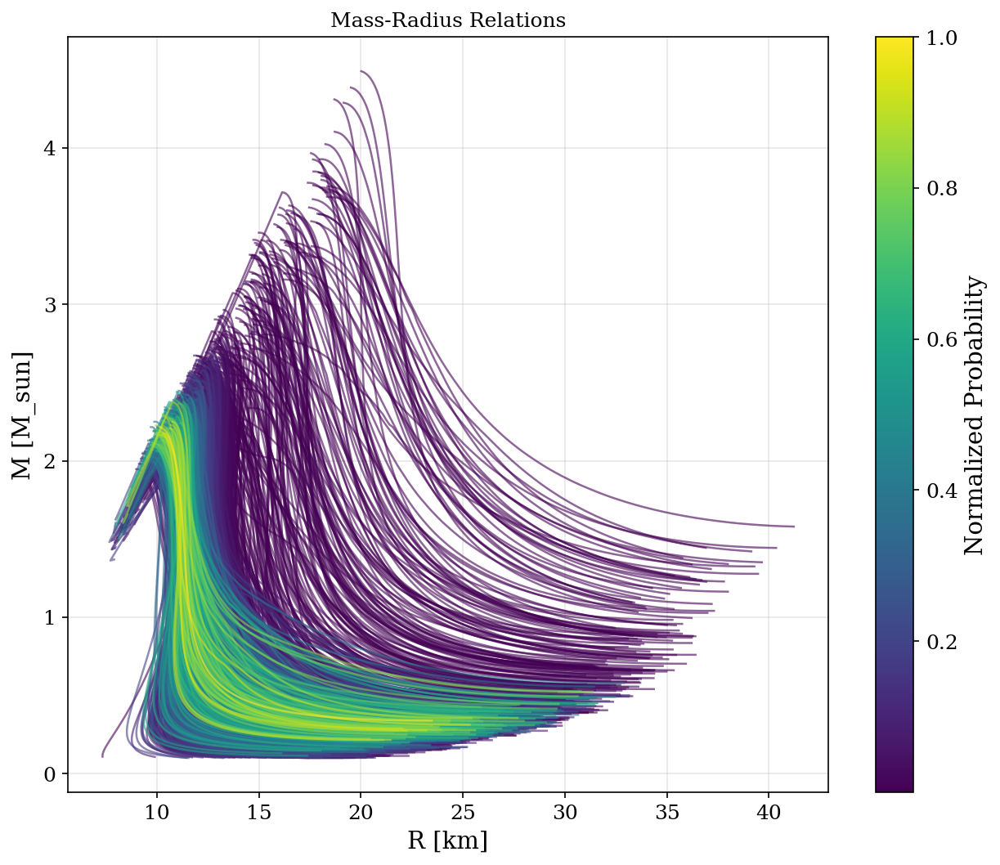

Creating pressure-density plot...


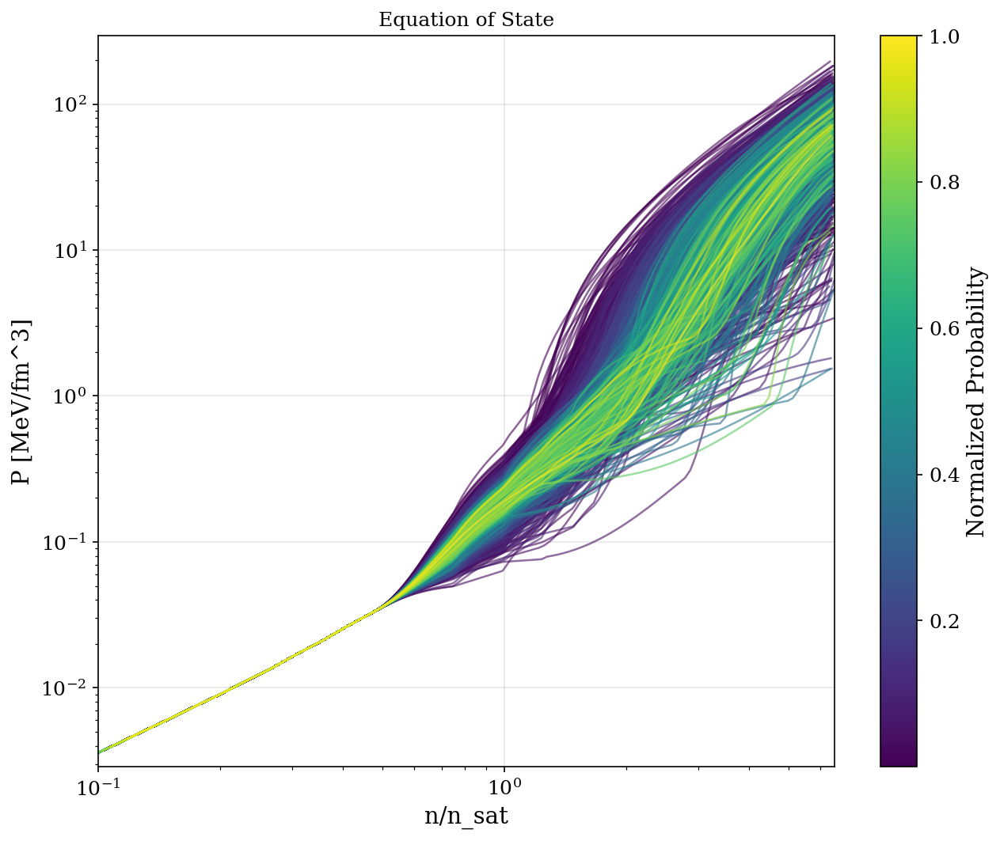

Creating cs2-density plot...


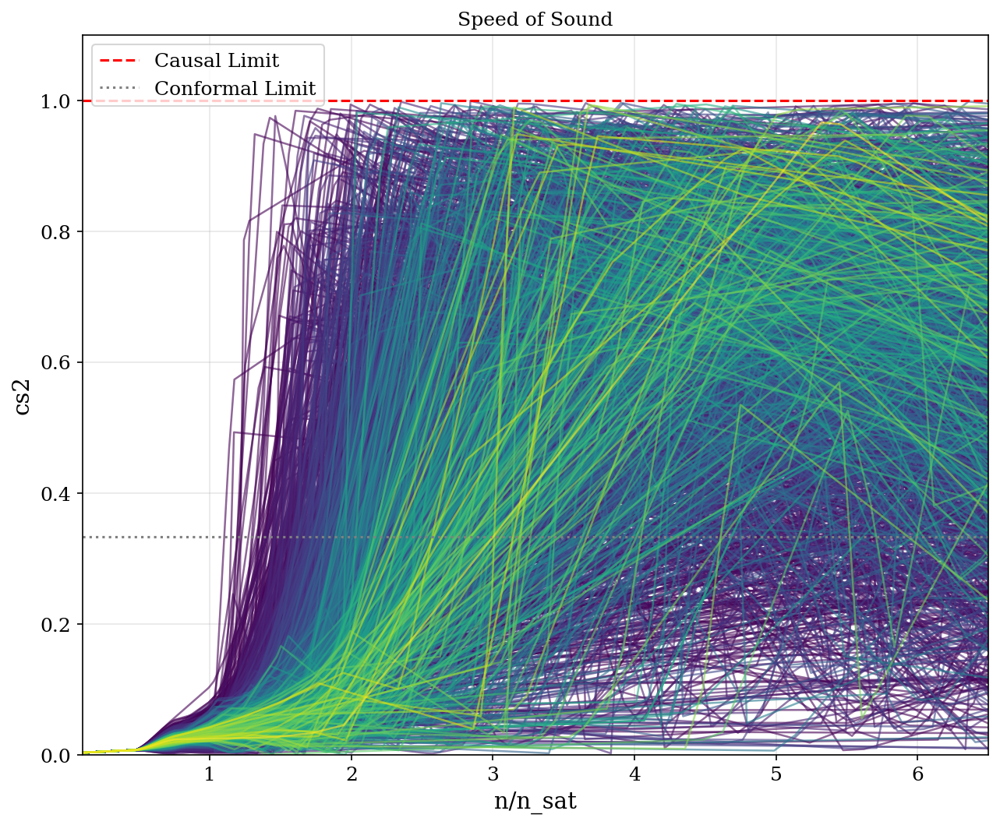

Creating histograms...


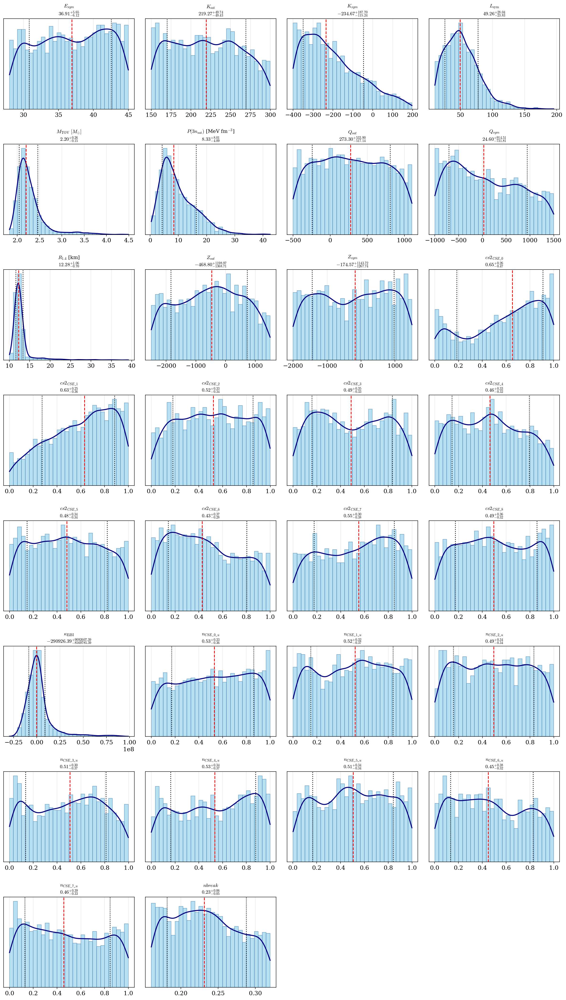

Creating cornerplot...


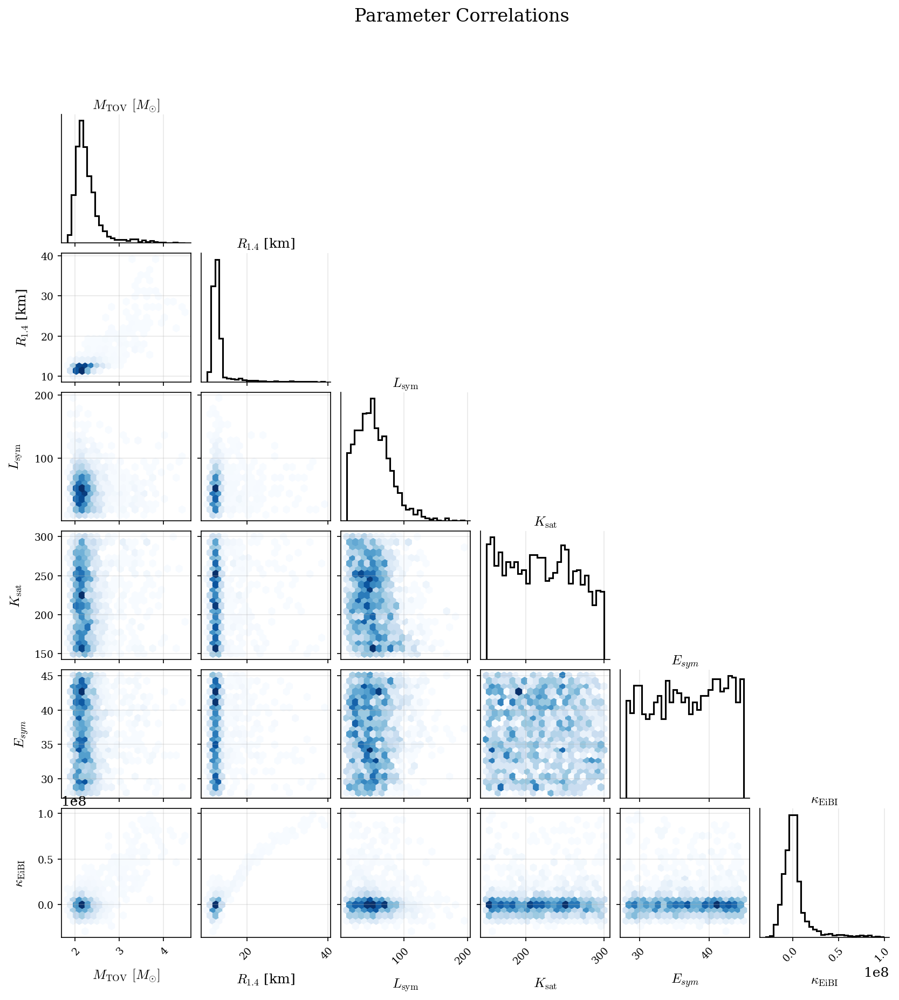

✅ All plots generated successfully.


In [10]:
r"""Modular postprocessing script for EOS inference results (Interactive Version).

FIXED: Handles complex parameter names (like n_CSE_0_u) by escaping underscores.
"""

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
import h5py
import os
import logging
from scipy.stats import gaussian_kde
from typing import Dict, Optional, Any, List
import warnings

# ==============================================================================
#                               USER CONFIGURATION
# ==============================================================================

RESULTS_PATH = "chiEFT_radio_GW170817/outdir/results.h5"
PRIOR_PATH = None
# 2. PLOT AESTHETICS & QUALITY
PLOT_CONFIG = {
    "DPI": 150,                 # Image resolution
    "FIG_SIZE": (10, 8),        # Default figure size
    "USE_TEX": True,            # Try LaTeX rendering
    "CMAP": plt.cm.viridis,     # Colormap
    "HIST_BINS": 30,            # Bins for 1D histograms
    "HIST_STYLE": "density",    # 'density' or 'count'
    "SHOW_TITLES": True,        # Show median +/- error titles
}

# 3. EOS PLOT SPECIFIC SETTINGS
EOS_DENSITY_LIMITS = [0.1, 6.5] 

# 4. MANUAL PARAMETER SELECTION
CORNER_PARAMS = None 
HIST_PARAMS = None   

# ==============================================================================
#                                  PHYSICS CONSTANTS
# ==============================================================================
N_SAT_SI = 0.16e45  # 0.16 fm^-3 in m^-3
GEOM_TO_MEVFM3 = 7.55e10 

# ==============================================================================
#                                  SYSTEM SETUP
# ==============================================================================

logging.basicConfig(level=logging.INFO, format='%(message)s')
logger = logging.getLogger("jester")

def setup_matplotlib(use_tex: bool = True) -> bool:
    plt.rcParams.update({
        "axes.grid": True, "grid.alpha": 0.3, "axes.labelsize": 14,
        "xtick.labelsize": 12, "ytick.labelsize": 12, "legend.fontsize": 12,
        "figure.titlesize": 16, "mathtext.fontset": "cm", "font.family": "serif",
    })
    tex_enabled = False
    if use_tex:
        try:
            from matplotlib.checkdep_usetex import checkdep_usetex
            if checkdep_usetex(True):
                plt.rcParams.update({"text.usetex": True, "font.serif": ["Computer Modern Roman", "Times New Roman"]})
                tex_enabled = True
                logger.info("✅ TeX rendering enabled")
        except Exception:
            logger.info(f"ℹ️ TeX not available. Using standard fonts.")
            plt.rcParams.update({"text.usetex": False, "font.serif": ["DejaVu Serif", "serif"]})
    return tex_enabled

TEX_ENABLED = setup_matplotlib(use_tex=PLOT_CONFIG["USE_TEX"])
DEFAULT_COLORMAP = PLOT_CONFIG["CMAP"]
COLORS_DICT = {"prior": "gray", "posterior": "blue"}

# ====================== DATA LOADING & PROCESSING ======================

def load_eos_data(filepath: str) -> Dict[str, Any]:
    if not os.path.exists(filepath): raise FileNotFoundError(f"File not found: {filepath}")
    logger.info(f"📂 Opening: {filepath}")
    with h5py.File(filepath, 'r') as f:
        data = {}
        if 'posterior' not in f: raise ValueError("Invalid H5.")
        post_group = f['posterior']
        
        # Determine group location
        group = post_group['derived_eos'] if 'derived_eos' in post_group else post_group
        
        # Load Raw Data
        data['masses'] = group.get('masses_EOS', group.get('masses'))[:]
        data['radii'] = group.get('radii_EOS', group.get('radii'))[:]
        data['cs2'] = group.get('cs2')[:]
        data['lambdas'] = group.get('Lambdas_EOS', group.get('lambdas'))[:]
        data['log_prob'] = post_group.get('log_prob')[:]
        
        # CONVERSION
        data['densities'] = group.get('n')[:] / N_SAT_SI
        data['pressures'] = group.get('p')[:] * GEOM_TO_MEVFM3
        
        # Load Parameters
        if 'parameters' in post_group:
            param_group = post_group['parameters']
            keys = list(param_group.keys())
            data['parameters'] = {key: param_group[key][:] for key in keys}
        else:
            data['parameters'] = {}

    data = calculate_derived_quantities(data)
    print_available_parameters(data['parameters'])
    logger.info(f"✅ Loaded {len(data['masses'])} posterior samples.")
    return data

def calculate_derived_quantities(data: Dict[str, Any]) -> Dict[str, Any]:
    m, r, n, p = data['masses'], data['radii'], data['densities'], data['pressures']
    mtovs, r14s, p3nsats = [], [], []
    for i in range(len(m)):
        mtovs.append(np.max(m[i]))
        try: r14s.append(np.interp(1.4, m[i][np.argsort(m[i])], r[i][np.argsort(m[i])]))
        except: r14s.append(np.nan)
        try: p3nsats.append(np.interp(3.0, n[i][np.argsort(n[i])], p[i][np.argsort(n[i])]))
        except: p3nsats.append(np.nan)
    data['parameters'].update({'M_TOV': np.array(mtovs), 'R_1.4': np.array(r14s), 'P_3nsat': np.array(p3nsats)})
    return data

def print_available_parameters(params: Dict[str, np.ndarray]):
    keys = sorted(list(params.keys()))
    print("\n" + "="*50 + "\n📋 AVAILABLE PARAMETERS\n" + "="*50)
    for i in range(0, len(keys), 3): print("".join([f"• {k:<25}" for k in keys[i:i+3]]))
    print("="*50 + "\n")

# ====================== CRITICAL FIX: LABEL FORMATTING ======================

def get_fancy_label(name: str) -> str:
    """Safely converts parameter names to LaTeX, handling multiple underscores."""
    MAPPING = {
        'M_TOV': r'$M_{\rm{TOV}}$ $[M_{\odot}]$', 'MTOV': r'$M_{\rm{TOV}}$ $[M_{\odot}]$',
        'R_1.4': r'$R_{1.4}$ [km]', 'P_3nsat': r'$P(3n_{\rm{sat}})$ [MeV fm$^{-3}$]',
        'L_sym': r'$L_{\rm{sym}}$', 'K_sat': r'$K_{\rm{sat}}$', 'kappa_eibi': r'$\kappa_{\rm{EiBI}}$'
    }
    if name in MAPPING: return MAPPING[name]
    
    # FIX: Handle names with multiple underscores like 'n_CSE_0_u'
    if '_' in name:
        parts = name.split('_')
        base = parts[0]
        
        # Check Greek letters
        if base in ['alpha', 'beta', 'gamma', 'delta', 'rho', 'sigma', 'kappa', 'lambda', 'epsilon']:
            base = f"\\{base}"
            
        # Escape remaining underscores in the suffix part
        # This converts 'CSE_0_u' -> 'CSE\_0\_u'
        sub = r'\_'.join(parts[1:])
        
        return f"${base}_{{{sub}}}$"
        
    return f"${name}$"

def get_sorted_indices_by_prob(log_prob): return np.argsort(log_prob)

# ====================== PLOTTING FUNCTIONS ======================

def make_pressure_density_plot(data: Dict[str, Any], prior_data: Optional[Dict[str, Any]], outdir: str):
    logger.info("Creating pressure-density plot...")
    fig, ax = plt.subplots(figsize=PLOT_CONFIG['FIG_SIZE'], dpi=PLOT_CONFIG['DPI'])
    
    n, p = data['densities'], data['pressures']
    log_prob = data.get('log_prob', np.zeros(len(n)))
    prob = np.exp(log_prob - np.max(log_prob))
    norm = Normalize(vmin=np.min(prob), vmax=np.max(prob))
    
    sorted_idx = get_sorted_indices_by_prob(log_prob)
    n_min, n_max = EOS_DENSITY_LIMITS
    valid_p_values = []
    
    for i in sorted_idx:
        color = DEFAULT_COLORMAP(norm(prob[i]))
        mask = (n[i] >= n_min) & (n[i] <= n_max) & (p[i] > 1e-3)
        if np.any(mask):
            ax.plot(n[i][mask], p[i][mask], color=color, alpha=0.6, linewidth=1.2)
            valid_p_values.extend(p[i][mask])
            
    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.set_xlim(n_min, n_max)
    if valid_p_values:
        ax.set_ylim(np.min(valid_p_values) * 0.8, np.max(valid_p_values) * 1.5)
    
    ax.set_xlabel(r"$n/n_{\rm{sat}}$" if TEX_ENABLED else "n/n_sat")
    ax.set_ylabel(r"$P$ [MeV fm$^{-3}$]" if TEX_ENABLED else "P [MeV/fm^3]")
    ax.set_title(f"Equation of State")
    sm = plt.cm.ScalarMappable(cmap=DEFAULT_COLORMAP, norm=norm); sm.set_array([])
    plt.colorbar(sm, ax=ax).set_label('Normalized Probability')
    plt.show()

def make_mass_radius_plot(data: Dict[str, Any], prior_data: Optional[Dict[str, Any]], outdir: str):
    logger.info("Creating mass-radius plot...")
    fig, ax = plt.subplots(figsize=PLOT_CONFIG['FIG_SIZE'], dpi=PLOT_CONFIG['DPI'])
    if prior_data:
        m_p, r_p = prior_data['masses'], prior_data['radii']
        for i in range(min(len(m_p), 500)): ax.plot(r_p[i], m_p[i], color=COLORS_DICT["prior"], alpha=0.05, zorder=0)

    m, r = data['masses'], data['radii']
    log_prob = data.get('log_prob', np.zeros(len(m)))
    prob = np.exp(log_prob - np.max(log_prob))
    norm = Normalize(vmin=np.min(prob), vmax=np.max(prob))
    
    sorted_idx = get_sorted_indices_by_prob(log_prob)
    has_data = False
    for i in sorted_idx:
        mask = (r[i] > 0.1) & (m[i] > 0.1)
        if np.any(mask):
            has_data = True
            color = DEFAULT_COLORMAP(norm(prob[i]))
            ax.plot(r[i][mask], m[i][mask], color=color, alpha=0.6, linewidth=1.2)
            
    ax.autoscale(enable=True, axis='both', tight=False)
    sm = plt.cm.ScalarMappable(cmap=DEFAULT_COLORMAP, norm=norm); sm.set_array([])
    plt.colorbar(sm, ax=ax).set_label('Normalized Probability')
    ax.set_xlabel(r"$R$ [km]" if TEX_ENABLED else "R [km]")
    ax.set_ylabel(r"$M$ [$M_{\odot}$]" if TEX_ENABLED else "M [M_sun]")
    ax.set_title("Mass-Radius Relations"); plt.show()

def make_cs2_plot(data: Dict[str, Any], prior_data: Optional[Dict[str, Any]], outdir: str):
    logger.info("Creating cs2-density plot...")
    fig, ax = plt.subplots(figsize=PLOT_CONFIG['FIG_SIZE'], dpi=PLOT_CONFIG['DPI'])
    n, cs2 = data['densities'], data['cs2']
    log_prob = data.get('log_prob', np.zeros(len(n)))
    prob = np.exp(log_prob - np.max(log_prob))
    norm = Normalize(vmin=np.min(prob), vmax=np.max(prob))
    sorted_idx = get_sorted_indices_by_prob(log_prob)
    
    for i in sorted_idx:
        color = DEFAULT_COLORMAP(norm(prob[i]))
        mask = (n[i] > 0)
        if np.any(mask):
            ax.plot(n[i][mask], cs2[i][mask], color=color, alpha=0.6, linewidth=1.2)
            
    ax.set_xlim(EOS_DENSITY_LIMITS[0], EOS_DENSITY_LIMITS[1])
    ax.set_ylim(0, 1.1)
    ax.axhline(1.0, color='red', linestyle='--', label='Causal Limit')
    ax.axhline(1/3, color='gray', linestyle=':', label='Conformal Limit')
    ax.set_xlabel(r"$n/n_{\rm{sat}}$" if TEX_ENABLED else "n/n_sat")
    ax.set_ylabel(r"$c_s^2$" if TEX_ENABLED else "cs2")
    ax.set_title("Speed of Sound"); ax.legend(); plt.show()

def make_cornerplot(data: Dict[str, Any], outdir: str, selection: Optional[List[str]] = None):
    logger.info("Creating cornerplot...")
    full_params = data['parameters']
    all_keys = sorted(list(full_params.keys()))
    if selection:
        param_names = [k for k in selection if k in all_keys]
        if not param_names: logger.error("No valid params"); return
    else:
        priority = ['M_TOV', 'R_1.4', 'L_sym', 'K_sat', 'E_sym', 'kappa_eibi', 'nbreak']
        param_names = [k for k in priority if k in all_keys][:6]
    
    n = len(param_names)
    fig, axes = plt.subplots(n, n, figsize=(max(8, n*2.2), max(8, n*2.2)), dpi=PLOT_CONFIG['DPI'])
    plt.subplots_adjust(wspace=0.08, hspace=0.08)
    
    for i in range(n):
        for j in range(n):
            ax = axes[i, j]
            x_name, y_name = param_names[j], param_names[i]
            x_data, y_data = full_params[x_name], full_params[y_name]
            mask = np.isfinite(x_data) & np.isfinite(y_data)
            x_data, y_data = x_data[mask], y_data[mask]
            
            if i == j:
                ax.hist(x_data, bins=PLOT_CONFIG['HIST_BINS'], density=True, color='k', histtype='step', lw=1.5)
                ax.set_yticks([]); ax.spines['top'].set_visible(False); ax.spines['right'].set_visible(False)
                ax.set_title(get_fancy_label(x_name), fontsize=12, pad=5)
            elif i > j:
                ax.hexbin(x_data, y_data, gridsize=20, cmap='Blues', mincnt=1)
            else: ax.axis('off')
            
            if i == n - 1:
                ax.set_xlabel(get_fancy_label(x_name), fontsize=12, labelpad=10)
                plt.setp(ax.get_xticklabels(), rotation=45, ha='right', rotation_mode="anchor", fontsize=9)
            else: ax.set_xticklabels([])
            if j == 0 and i != j:
                ax.set_ylabel(get_fancy_label(y_name), fontsize=12, labelpad=10)
                plt.setp(ax.get_yticklabels(), fontsize=9)
            else: ax.set_yticklabels([])
    plt.suptitle("Parameter Correlations", y=0.98, fontsize=16); plt.show()

def make_parameter_histograms(data: Dict[str, Any], outdir: str, selection: Optional[List[str]] = None):
    logger.info("Creating histograms...")
    params = data['parameters']
    all_keys = sorted(list(params.keys()))
    param_names = [k for k in selection if k in all_keys] if selection else all_keys
    
    n_params = len(param_names)
    cols = 4
    rows = (n_params + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(cols*4, rows*3.5), dpi=PLOT_CONFIG['DPI'])
    axes_flat = axes.flatten() if n_params > 1 else [axes]
    
    for idx, name in enumerate(param_names):
        ax = axes_flat[idx]
        values = params[name][np.isfinite(params[name])]
        if len(values) == 0: continue
        med, low, high = np.median(values), np.percentile(values, 16), np.percentile(values, 84)
        
        ax.hist(values, bins=PLOT_CONFIG['HIST_BINS'], density=True, color='skyblue', alpha=0.6, edgecolor='steelblue')
        try:
            kde = gaussian_kde(values)
            x = np.linspace(min(values), max(values), 200)
            ax.plot(x, kde(x), color='navy', lw=2)
        except: pass
        ax.axvline(med, color='red', linestyle='--'); ax.axvline(low, color='k', linestyle=':'); ax.axvline(high, color='k', linestyle=':')
        
        label = get_fancy_label(name)
        title = f"${med:.2f}_{{-{med-low:.2f}}}^{{+{high-med:.2f}}}$" if PLOT_CONFIG['SHOW_TITLES'] else ""
        ax.set_title(f"{label}\n{title}", fontsize=10)
        ax.set_yticks([])
    
    for idx in range(n_params, len(axes_flat)): axes_flat[idx].axis('off')
    plt.tight_layout(); plt.show()

# ====================== EXECUTION ======================
if __name__ == "__main__":
    try:
        base_dir = os.path.dirname(RESULTS_PATH)
        figures_dir = os.path.join(base_dir, "figures")
        data = load_eos_data(RESULTS_PATH)
        prior_data = load_prior_data(PRIOR_PATH)
        
        make_mass_radius_plot(data, prior_data, figures_dir)
        make_pressure_density_plot(data, prior_data, figures_dir)
        make_cs2_plot(data, prior_data, figures_dir)
        make_parameter_histograms(data, figures_dir, selection=HIST_PARAMS)
        make_cornerplot(data, figures_dir, selection=CORNER_PARAMS)
        
        logger.info("✅ All plots generated successfully.")
    except Exception as e:
        logger.error(f"❌ Error: {e}")